In [14]:
from oracles import QuadraticOracle
import numpy as np
from plot_trajectory_2d import plot_levels, plot_trajectory
from optimization import newton, gradient_descent
import oracles
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import scipy

import plotly.express as px

from sklearn.datasets import load_svmlight_file

import plotly
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

%reload_ext autoreload
%autoreload 2

# w8a

In [15]:
data_w8a = load_svmlight_file('./w8a.txt')

In [16]:
data_w8a[0].shape

(49749, 300)

In [17]:
m_data_w8a = len(data_w8a[1])

In [18]:
oracle_w8a = oracles.create_log_reg_oracle(data_w8a[0], data_w8a[1], regcoef=1/m_data_w8a)

## Wolf

In [156]:
x_w8a_grad_W, mes_w8a_grad_W, hist_w8a_grad_W = gradient_descent(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-5)

In [157]:
mes_w8a_grad

'success'

In [158]:
log_grad_w8a_grad_W = np.log10(np.array(hist_w8a_grad_W['grad']) ** 2 / hist_w8a_grad_W['grad'][0] ** 2)

In [22]:
x_w8a_new_W, mes_w8a_new_W, hist_w8a_new_W = newton(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-9)

In [23]:
mes_w8a_new_W

'success'

In [24]:
log_grad_w8a_new_W = np.log10(np.array(hist_w8a_new_W['grad']) ** 2 / hist_w8a_new_W['grad'][0] ** 2)

In [25]:
colors = px.colors.qualitative.Set1[0:2]

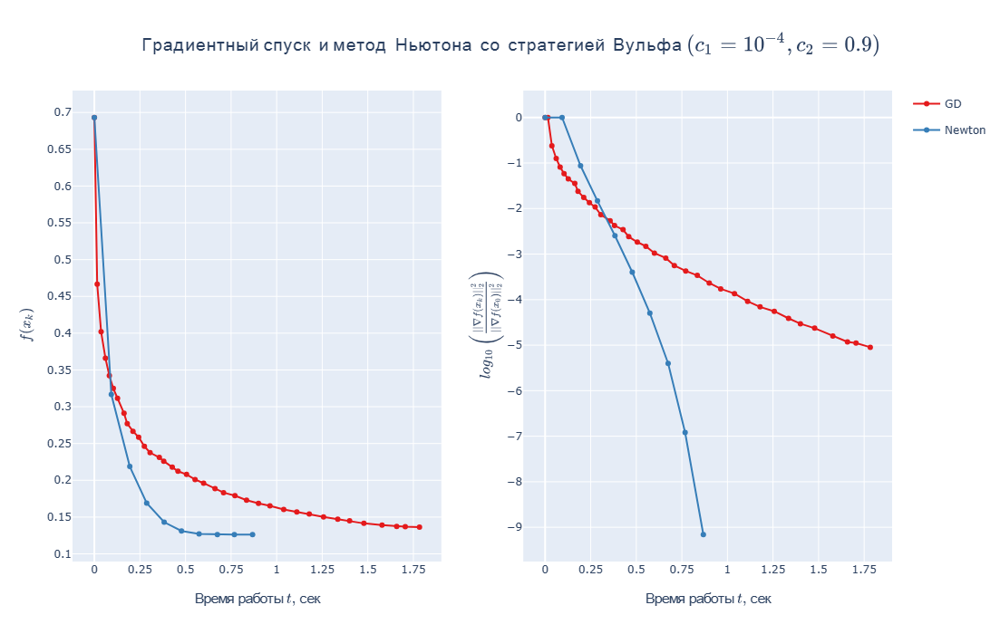

In [170]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_w8a_grad_W['time'], y=hist_w8a_grad_W['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_w8a_new_W['time'], y=hist_w8a_new_W['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_w8a_grad_W['time'], y=log_grad_w8a_grad_W, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_w8a_new_W['time'], y=log_grad_w8a_new_W, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный спуск  и метод  Ньютона  со  стратегией  Вульфа } (c_1=10^{-4}, c_2=0.9) $', title_x=0.5,
                 width=1100,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=0.25
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=0.25

fig.show()

## Armijo

In [27]:
x_w8a_grad_A, mes_w8a_grad_A, hist_w8a_grad_A = gradient_descent(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-5, line_search_options={'method': 'Armijo'})

In [28]:
mes_w8a_grad_A

'success'

In [29]:
log_grad_w8a_grad_A = np.log10(np.array(hist_w8a_grad_A['grad']) ** 2 / hist_w8a_grad_A['grad'][0] ** 2)

In [30]:
x_w8a_new_A, mes_w8a_new_A, hist_w8a_new_A = newton(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-9)

In [31]:
mes_w8a_new_A

'success'

In [32]:
log_grad_w8a_new_A = np.log10(np.array(hist_w8a_new_A['grad']) ** 2 / hist_w8a_new_A['grad'][0] ** 2)

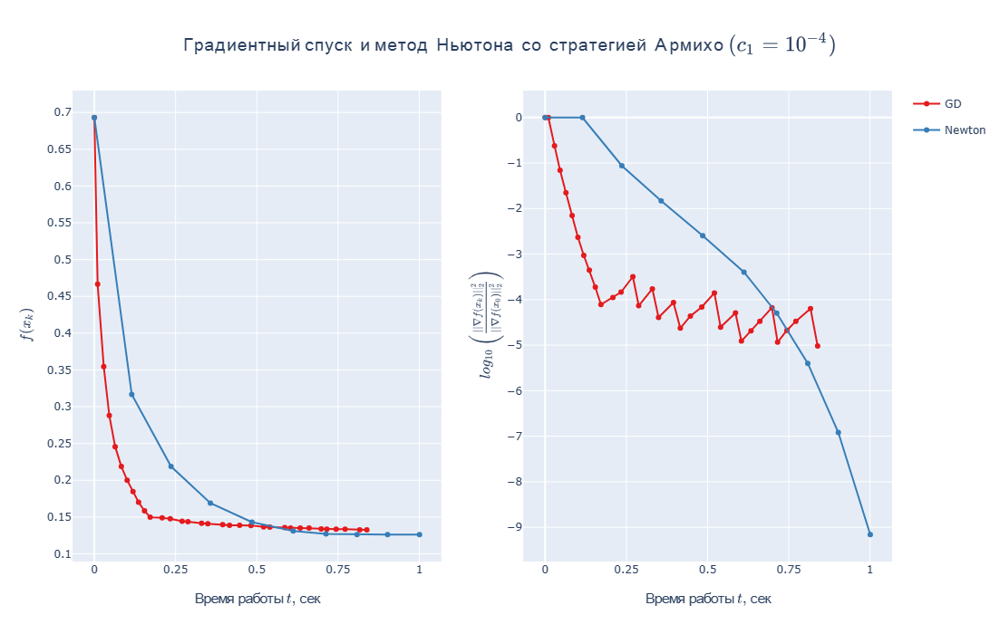

In [171]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_w8a_grad_A['time'], y=hist_w8a_grad_A['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_w8a_new_A['time'], y=hist_w8a_new_A['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_w8a_grad_A['time'], y=log_grad_w8a_grad_A, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_w8a_new_A['time'], y=log_grad_w8a_new_A, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный спуск  и метод  Ньютона  со  стратегией  Армихо } (c_1=10^{-4}) $', title_x=0.5,
                 width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=0.25
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=0.25

fig.show()

## Constant

In [34]:
x_w8a_grad_C, mes_w8a_grad_C, hist_w8a_grad_C = gradient_descent(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-5, line_search_options={'method': 'Constant'})

In [35]:
mes_w8a_grad_C

'success'

In [36]:
log_grad_w8a_grad_C = np.log10(np.array(hist_w8a_grad_C['grad']) ** 2 / hist_w8a_grad_C['grad'][0] ** 2)

In [37]:
x_w8a_new_C, mes_w8a_new_C, hist_w8a_new_C = newton(oracle_w8a, np.array([0] * 300), trace=True, tolerance=1e-9)

In [38]:
mes_w8a_new_C

'success'

In [39]:
log_grad_w8a_new_C = np.log10(np.array(hist_w8a_new_C['grad']) ** 2 / hist_w8a_new_C['grad'][0] ** 2)

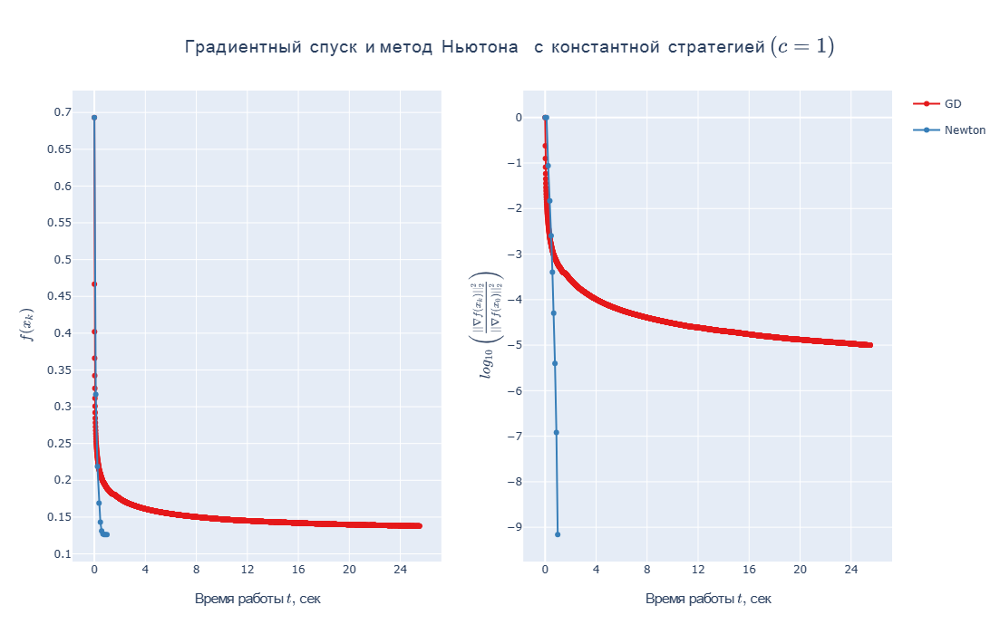

In [172]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_w8a_grad_C['time'], y=hist_w8a_grad_C['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_w8a_new_C['time'], y=hist_w8a_new_C['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_w8a_grad_C['time'], y=log_grad_w8a_grad_C, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_w8a_new_C['time'], y=log_grad_w8a_new_C, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и метод  Ньютона    с  константной  стратегией } (c=1) $', title_x=0.5,
                 width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=4
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=4

fig.show()

# Gissete

In [41]:
data_gis = load_svmlight_file('./gisette_scale/gisette_scale')

In [42]:
data_gis[0].shape

(6000, 5000)

In [43]:
m_data_gis = len(data_gis[1])

In [44]:
oracle_gis = oracles.create_log_reg_oracle(data_gis[0], data_gis[1], regcoef=1/m_data_gis)

## Wolf

In [45]:
x_gis_grad_W, mes_gis_grad_W, hist_gis_grad_W = gradient_descent(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-5)

In [46]:
mes_gis_grad_W

'success'

In [47]:
log_grad_gis_grad_W = np.log10(np.array(hist_gis_grad_W['grad']) ** 2 / hist_gis_grad_W['grad'][0] ** 2)

In [48]:
x_gis_new_W, mes_gis_new_W, hist_gis_new_W = newton(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-9)

In [49]:
mes_gis_new_W

'success'

In [50]:
log_grad_gis_new_W = np.log10(np.array(hist_gis_new_W['grad']) ** 2 / hist_gis_new_W['grad'][0] ** 2)

In [51]:
colors = px.colors.qualitative.Set1[0:2]

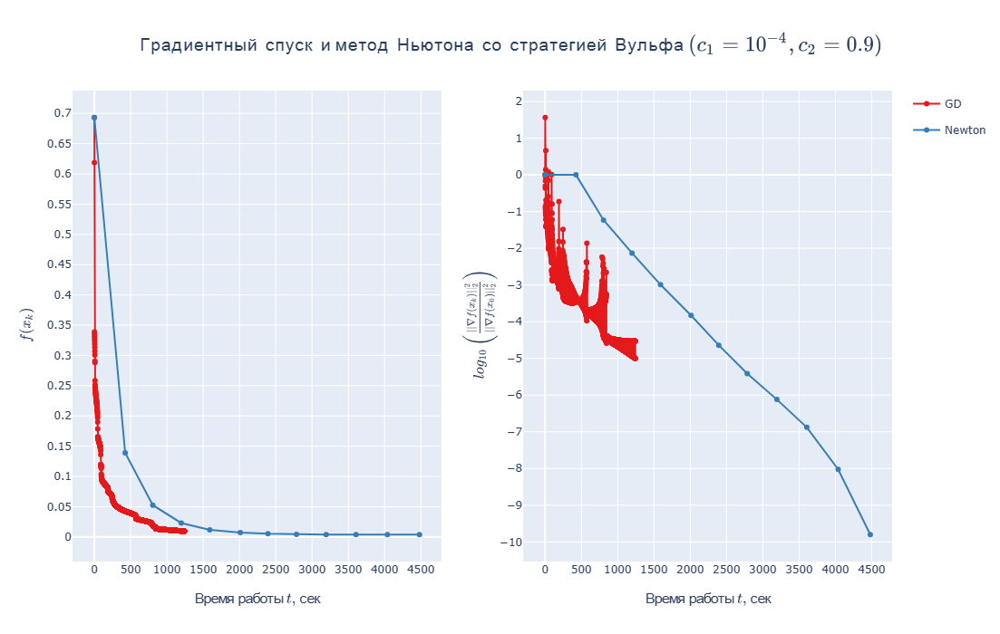

In [173]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_gis_grad_W['time'], y=hist_gis_grad_W['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_gis_new_W['time'], y=hist_gis_new_W['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_gis_grad_W['time'], y=log_grad_gis_grad_W, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_gis_new_W['time'], y=log_grad_gis_new_W, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  со  стратегией  Вульфа } (c_1=10^{-4}, c_2=0.9) $', title_x=0.5,
                  width=1000,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=500
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=500

fig.show()

## Armijo

In [53]:
x_gis_grad_A, mes_gis_grad_A, hist_gis_grad_A = gradient_descent(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-5, line_search_options={'method': 'Armijo'})

In [54]:
mes_gis_grad_A

'success'

In [55]:
log_grad_gis_grad_A = np.log10(np.array(hist_gis_grad_A['grad']) ** 2 / hist_gis_grad_A['grad'][0] ** 2)

In [56]:
x_gis_new_A, mes_gis_new_A, hist_gis_new_A = newton(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-9, line_search_options={'method': 'Armijo'})

In [57]:
mes_gis_new_A

'success'

In [58]:
log_grad_gis_new_A = np.log10(np.array(hist_gis_new_A['grad']) ** 2 / hist_gis_new_A['grad'][0] ** 2)

In [59]:
colors = px.colors.qualitative.Set1[0:2]

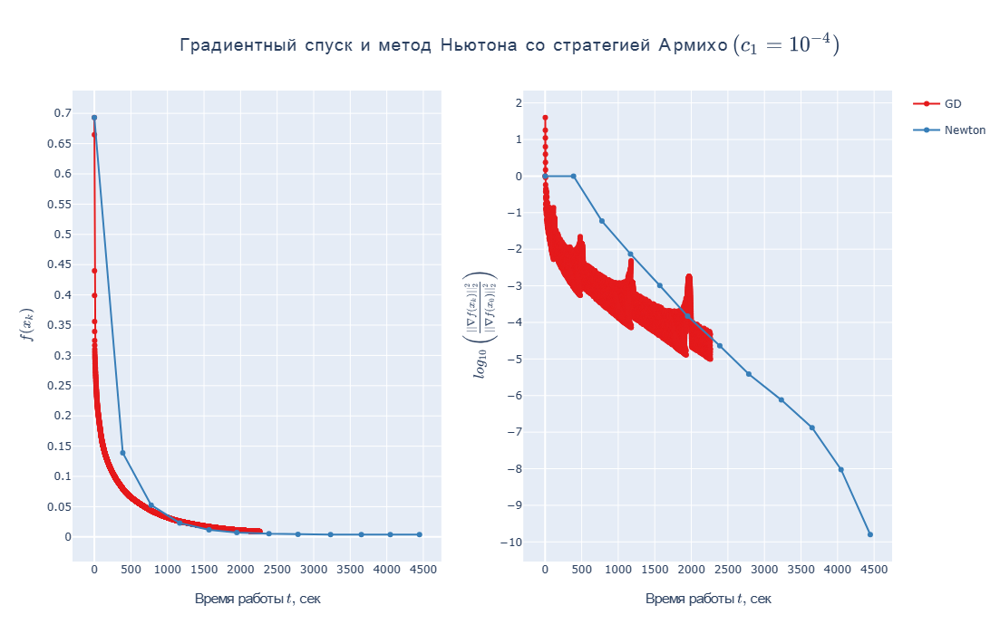

In [174]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_gis_grad_A['time'], y=hist_gis_grad_A['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_gis_new_A['time'], y=hist_gis_new_A['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_gis_grad_A['time'], y=log_grad_gis_grad_A, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_gis_new_A['time'], y=log_grad_gis_new_A, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  со  стратегией  Армихо } (c_1=10^{-4}) $', title_x=0.5,
                 width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=500
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=500

fig.show()

## Constant

In [84]:
x_gis_grad_C, mes_gis_grad_C, hist_gis_grad_C = gradient_descent(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-5, line_search_options={'method': 'Constant'})

In [85]:
mes_gis_grad_C

'success'

In [86]:
log_grad_gis_grad_C = np.log10(np.array(hist_gis_grad_C['grad']) ** 2 / hist_gis_grad_C['grad'][0] ** 2)

In [87]:
x_gis_new_C, mes_gis_new_C, hist_gis_new_C = newton(oracle_gis, np.array([0] * 5000), trace=True, tolerance=1e-9, line_search_options={'method': 'Constant'})

In [88]:
mes_gis_new_C

'success'

In [89]:
log_grad_gis_new_C = np.log10(np.array(hist_gis_new_C['grad']) ** 2 / hist_gis_new_C['grad'][0] ** 2)

In [90]:
colors = px.colors.qualitative.Set1[0:2]

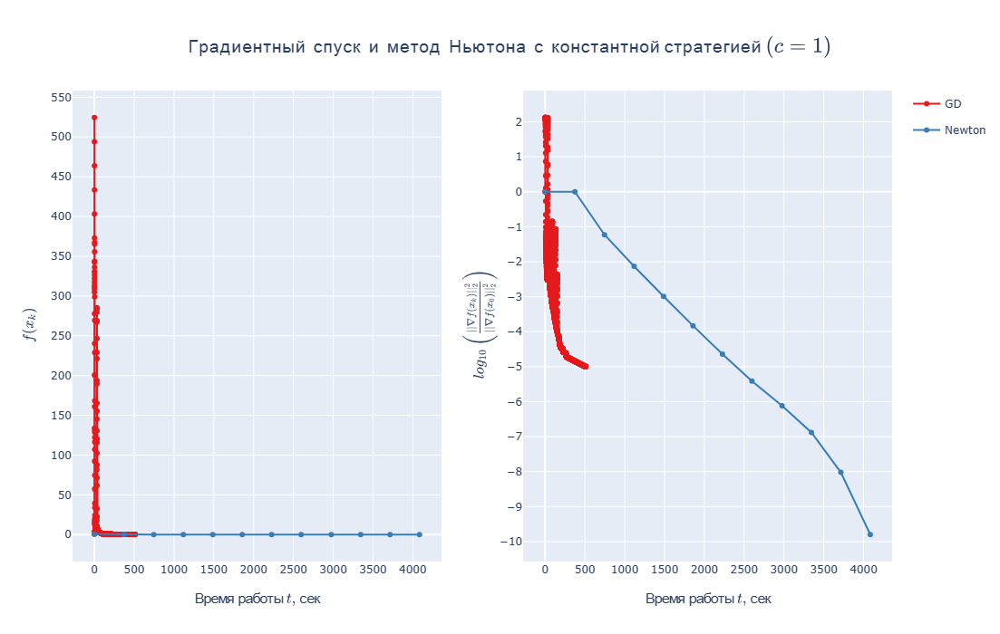

In [175]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_gis_grad_C['time'], y=hist_gis_grad_C['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_gis_new_C['time'], y=hist_gis_new_C['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_gis_grad_C['time'], y=log_grad_gis_grad_C, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_gis_new_C['time'], y=log_grad_gis_new_C, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  с  константной стратегией } (c=1) $', title_x=0.5,
                 width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=50
fig['layout']['xaxis']['dtick']=500
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=500

fig.show()

# Real-sim

In [97]:
data_real = load_svmlight_file('./real-sim/real-sim')

In [98]:
data_real[0].shape

(72309, 20958)

In [101]:
m_data_real = len(data_real[1])

In [102]:
oracle_real = oracles.create_log_reg_oracle(data_real[0], data_real[1], regcoef=1/m_data_real)

## Wolf

In [118]:
x_real_grad_W, mes_real_grad_W, hist_real_grad_W = gradient_descent(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-9)

In [119]:
mes_real_grad_W

'success'

In [120]:
log_grad_real_grad_W = np.log10(np.array(hist_real_grad_W['grad']) ** 2 / hist_real_grad_W['grad'][0] ** 2)

In [108]:
x_real_new_W, mes_real_new_W, hist_real_new_W = newton(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-9)

In [109]:
mes_real_new_W

'success'

In [110]:
log_grad_real_new_W = np.log10(np.array(hist_real_new_W['grad']) ** 2 / hist_real_new_W['grad'][0] ** 2)

In [111]:
colors = px.colors.qualitative.Set1[0:2]

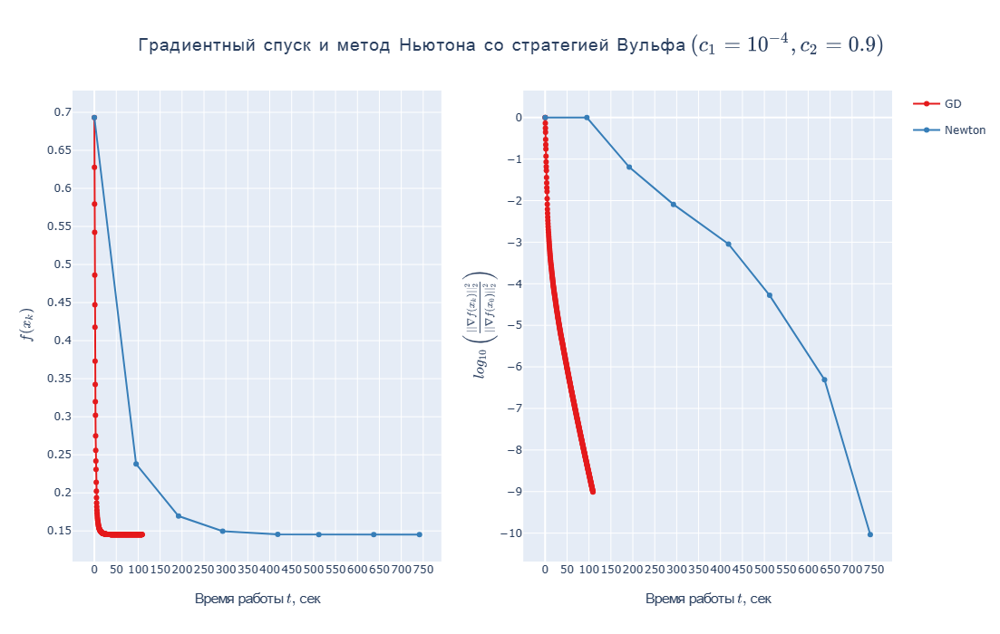

In [176]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_real_grad_W['time'], y=hist_real_grad_W['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_real_new_W['time'], y=hist_real_new_W['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_real_grad_W['time'], y=log_grad_real_grad_W, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_real_new_W['time'], y=log_grad_real_new_W, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  со  стратегией  Вульфа } (c_1=10^{-4}, c_2=0.9) $', title_x=0.5,
                  width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=50
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=50

fig.show()

## Armijo

In [131]:
x_real_grad_A, mes_real_grad_A, hist_real_grad_A = gradient_descent(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-9, line_search_options={'method': 'Armijo'})

In [132]:
mes_real_grad_A

'success'

In [133]:
log_grad_real_grad_A = np.log10(np.array(hist_real_grad_A['grad']) ** 2 / hist_real_grad_A['grad'][0] ** 2)

In [134]:
x_real_new_A, mes_real_new_A, hist_real_new_A = newton(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-9, line_search_options={'method': 'Armijo'})

In [135]:
mes_real_new_A

'success'

In [136]:
log_grad_real_new_A = np.log10(np.array(hist_real_new_A['grad']) ** 2 / hist_real_new_A['grad'][0] ** 2)

In [137]:
colors = px.colors.qualitative.Set1[0:2]

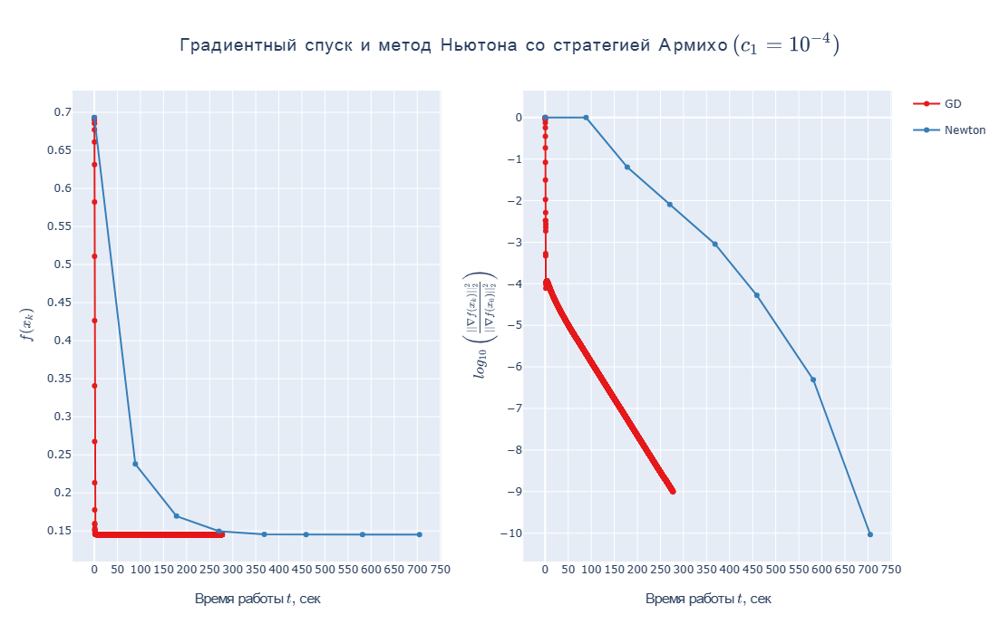

In [168]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_real_grad_A['time'], y=hist_real_grad_A['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_real_new_A['time'], y=hist_real_new_A['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_real_grad_A['time'], y=log_grad_real_grad_A, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_real_new_A['time'], y=log_grad_real_new_A, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  со  стратегией  Армихо } (c_1=10^{-4}) $', title_x=0.5,
                  width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=50
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=50

fig.show()

## Costant

In [147]:
x_real_grad_C, mes_real_grad_C, hist_real_grad_C = gradient_descent(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-5, line_search_options={'method': 'Constant'}, max_iter=30000)

In [148]:
mes_real_grad_C

'iterations_exceeded'

In [149]:
log_grad_real_grad_C = np.log10(np.array(hist_real_grad_C['grad']) ** 2 / hist_real_grad_C['grad'][0] ** 2)

In [142]:
x_real_new_C, mes_real_new_C, hist_real_new_C = newton(oracle_real, np.array([0] * 20958), trace=True, tolerance=1e-9, line_search_options={'method': 'Constant'})

In [143]:
mes_real_new_C

'success'

In [144]:
log_grad_real_new_C = np.log10(np.array(hist_real_new_C['grad']) ** 2 / hist_real_new_C['grad'][0] ** 2)

In [145]:
colors = px.colors.qualitative.Set1[0:2]

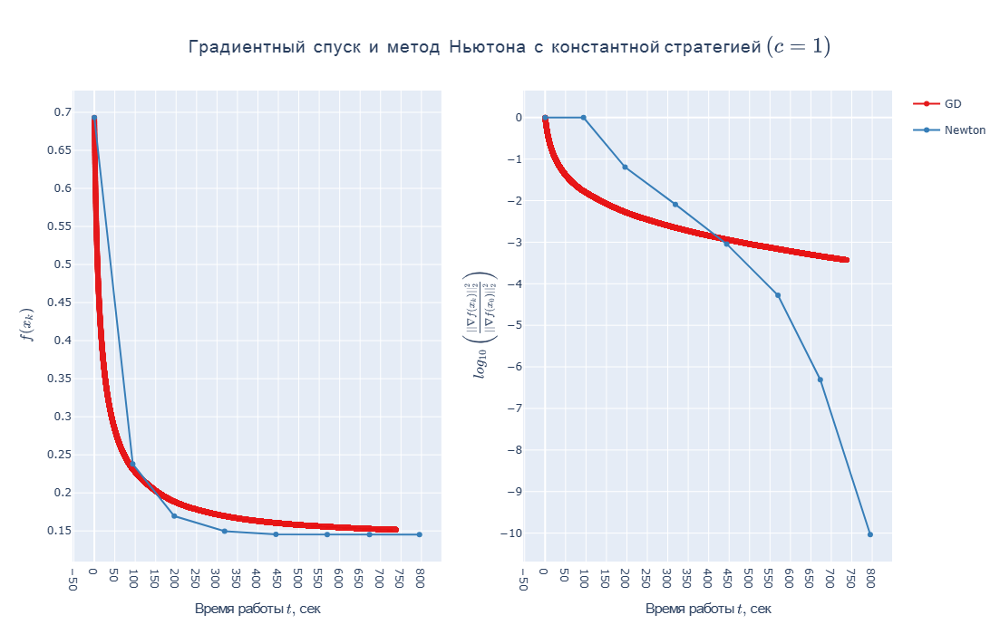

In [169]:
fig = make_subplots(rows=1, cols=2, )  # subplot_titles=('Subplot title1',  'Subplot title2')

fig.add_trace(go.Scatter(x=hist_real_grad_C['time'], y=hist_real_grad_C['func'], name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group'), row=1, col=1)
fig.add_trace(go.Scatter(x=hist_real_new_C['time'], y=hist_real_new_C['func'], name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2'), row=1, col=1)

fig.add_trace(go.Scatter(x=hist_real_grad_C['time'], y=log_grad_real_grad_C, name='GD',
                         mode='lines+markers', line_color=colors[0], legendgroup='group', showlegend=False), row=1, col=2)
fig.add_trace(go.Scatter(x=hist_real_new_C['time'], y=log_grad_real_new_C, name='Newton',
                         mode='lines+markers', line_color=colors[1], legendgroup='group2', showlegend=False), row=1, col=2)

fig.update_layout(title_text=r'$\Large\textrm{Градиентный  спуск  и  метод  Ньютона  с  константной стратегией } (c=1) $', title_x=0.5,
                  width=1200,
                 height=700,)
fig['layout']['xaxis']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['xaxis2']['title']=r'$\text{Время работы } t \text{, сек}$'
fig['layout']['yaxis']['title']=r'$f(x_k)$'
fig['layout']['yaxis2']['title']=r'$log_{10}\left(\frac{||\nabla f(x_k)||_2^2}{||\nabla f(x_0)||_2^2} \right)$'
fig['layout']['yaxis']['dtick']=0.05
fig['layout']['xaxis']['dtick']=50
fig['layout']['yaxis2']['dtick']=1
fig['layout']['xaxis2']['dtick']=50

fig.show()